# Rainfall Weather Forecasting

## Project Description

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there


Dataset Description:
Number of columns: 23


Date  - The date of observation
Location  -The common name of the location of the weather station
MinTemp  -The minimum temperature in degrees celsius
MaxTemp -The maximum temperature in degrees celsius
Rainfall  -The amount of rainfall recorded for the day in mm
Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
Sunshine  -The number of hours of bright sunshine in the day.
WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
WindDir9am -Direction of the wind at 9am
WindDir3pm -Direction of the wind at 3pm
WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
Humidity9am -Humidity (percent) at 9am
Humidity3pm -Humidity (percent) at 3pm
Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
Cloud9am - Fraction of sky obscured by cloud at 9am. 
Cloud3pm -Fraction of sky obscured by cloud 
Temp9am-Temperature (degrees C) at 9am
Temp3pm -Temperature (degrees C) at 3pm
RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


# Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Rainfall%20Forecast/Rainfall.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.tail(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8415,2017-06-16,Uluru,5.2,24.3,0.0,NaN,NaN,E,24.0,SE,...,53.0,24.0,1023.8,1020.0,NaN,NaN,12.3,23.3,No,No
8416,2017-06-17,Uluru,6.4,23.4,0.0,NaN,NaN,ESE,31.0,S,...,53.0,25.0,1025.8,1023.0,NaN,NaN,11.2,23.1,No,No
8417,2017-06-18,Uluru,8.0,20.7,0.0,NaN,NaN,ESE,41.0,SE,...,56.0,32.0,1028.1,1024.3,NaN,7.0,11.6,20.0,No,No
8418,2017-06-19,Uluru,7.4,20.6,0.0,NaN,NaN,E,35.0,ESE,...,63.0,33.0,1027.2,1023.3,NaN,NaN,11.0,20.3,No,No
8419,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


# Exploratory Data Analysis

In [5]:
print('Number of Rows:',df.shape[0])
print('Number of Columns:',df.shape[1])

Number of Rows: 8425
Number of Columns: 23


In [6]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

There are 2 datatypes in the dataset;float64 and object

### extracting date,month and year column from the Date column


In [8]:
# the Date column is in object datatype.So,firstly we need to convert this column into datetime datatype.
df['Date']=pd.to_datetime(df['Date'])

In [9]:
df['Day']=df['Date'].dt.day
df['Month']=df['Date'].dt.month
df['Year']=df['Date'].dt.year

In [10]:
# dropping Date column
df.drop(columns=['Date'],inplace=True)

In [11]:
# checking for duplicate values
df.duplicated().sum()

1663

 Duplicate values are present in the dataset

In [12]:
# dropping duplicates
df.drop_duplicates()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,1020.3,NaN,NaN,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,1019.1,NaN,NaN,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,1016.8,NaN,NaN,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,...,1016.5,3.0,2.0,15.1,26.0,No,No,24,6,2017


In [13]:
#check if any whitespace, 'NA' or '-' exist in dataset.
df.isin([' ','NA','-']).sum().any()

False

no white spaces are present in the dataset

In [14]:
#checking null values
df.isnull().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Day                 0
Month               0
Year                0
dtype: int64

All the columns except location,date,month and year contain null values

<Axes: >

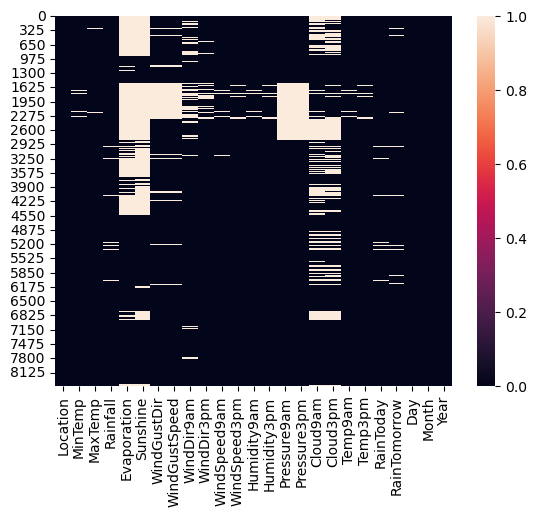

In [15]:
# visualization using heatmap
sns.heatmap(df.isnull())

# filling null values

In [16]:
#filling (WindGustDir,WindDir9am,WindSpeed9am) column With Mode of the column.
df['WindGustDir'].fillna(value=df['WindGustDir'].mode()[0], inplace= True)
df['WindDir9am'].fillna(value=df['WindDir9am'].mode()[0], inplace= True)
df['WindDir3pm'].fillna(value=df['WindDir3pm'].mode()[0], inplace= True)
df['RainToday'].fillna(value=df['RainToday'].mode()[0], inplace= True)
df['RainTomorrow'].fillna(value=df['RainTomorrow'].mode()[0], inplace= True)

In [17]:
#filling null column with mean value of column.
df['Sunshine'].fillna(value=df['Sunshine'].mean(), inplace= True)
df['Evaporation'].fillna(value=df['Evaporation'].mean(), inplace= True)
df['Cloud9am'].fillna(value=df['Cloud9am'].mean(), inplace= True)
df['Cloud3pm'].fillna(value=df['Cloud3pm'].mean(), inplace= True)
df['Pressure9am'].fillna(value=df['Pressure9am'].mean(), inplace= True)
df['Pressure3pm'].fillna(value=df['Pressure3pm'].mean(), inplace= True)
df['WindGustSpeed'].fillna(value=df['WindGustSpeed'].mean(), inplace= True)
df['Rainfall'].fillna(value=df['Rainfall'].mean(), inplace= True)
df['WindSpeed9am'].fillna(value=df['WindSpeed9am'].mean(), inplace= True)
df['WindSpeed3pm'].fillna(value=df['WindSpeed3pm'].mean(), inplace= True)
df['Humidity9am'].fillna(value=df['Humidity9am'].mean(), inplace= True)
df['Humidity3pm'].fillna(value=df['Humidity3pm'].mean(), inplace= True)
df['Pressure9am'].fillna(value=df['Pressure9am'].mean(), inplace= True)
df['Pressure3pm'].fillna(value=df['Pressure3pm'].mean(), inplace= True)
df['Cloud9am'].fillna(value=df['Cloud9am'].mean(), inplace= True)
df['Cloud3pm'].fillna(value=df['Cloud3pm'].mean(), inplace= True)
df['Temp9am'].fillna(value=df['Temp9am'].mean(), inplace= True)
df['Temp3pm'].fillna(value=df['Temp3pm'].mean(), inplace= True)
df['MinTemp'].fillna(value=df['MinTemp'].mean(), inplace= True)
df['MaxTemp'].fillna(value=df['MaxTemp'].mean(), inplace= True)

In [18]:
# again checking null values
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
Year             0
dtype: int64

now all the null values are removed from the dataset.

In [19]:
df.shape

(8425, 25)

In [27]:
df.drop_duplicates()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


# Data Visualization

### univariate analysis

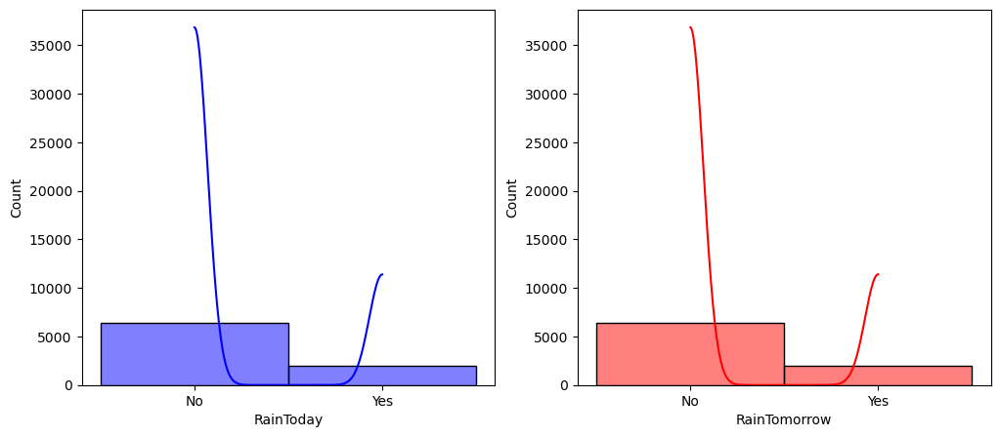

In [20]:
# Plotting histogram for (RainToday and RainTomorrow) both are target variables.
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['RainToday'],kde=True,color='b')
plt.subplot(1,2,2)
sns.histplot(df['RainTomorrow'],kde=True,color='r')
plt.show()

In [21]:
df['Location'].value_counts() 

Location
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: count, dtype: int64

In [22]:
df['WindDir9am'].value_counts() 

WindDir9am
N      1735
SW      704
NW      625
WSW     543
SE      505
WNW     480
SSW     467
ENE     433
NNE     430
W       414
NE      409
S       402
E       380
SSE     365
NNW     280
ESE     253
Name: count, dtype: int64

In [23]:
df['WindDir3pm'].value_counts() 

WindDir3pm
SE     1121
S       742
SSE     623
WSW     580
NE      544
N       524
SW      494
WNW     487
NW      468
W       462
ESE     462
E       460
ENE     417
SSW     370
NNE     365
NNW     306
Name: count, dtype: int64

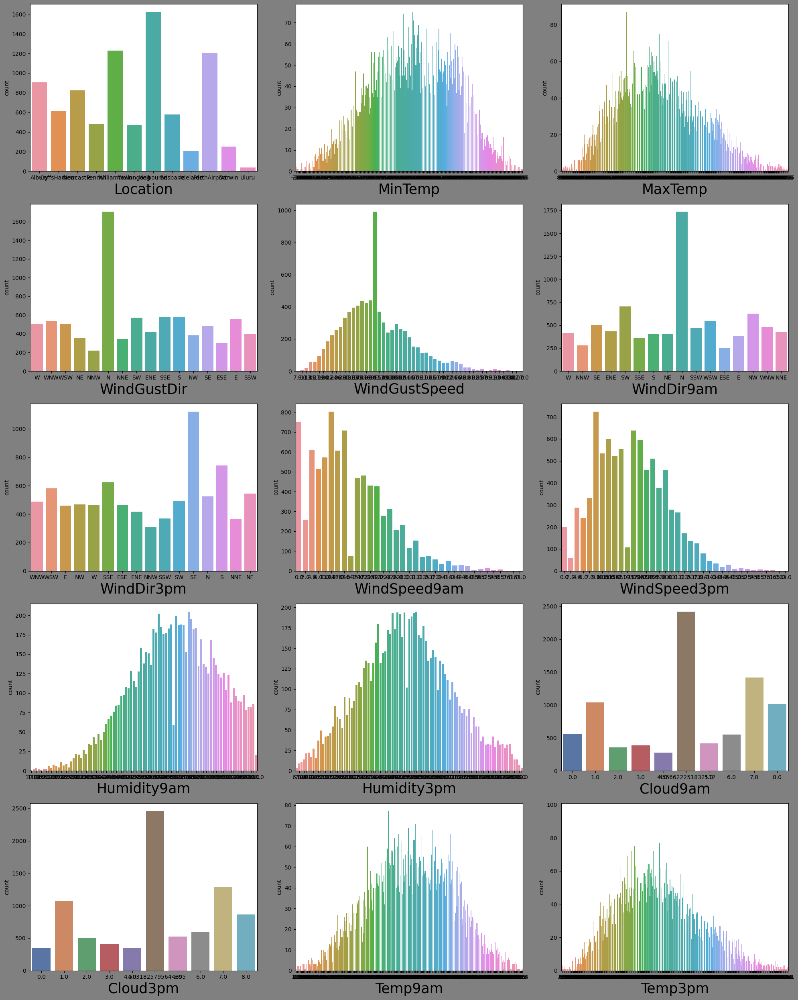

In [24]:
sns.set_palette('deep')
plt.figure(figsize=(20,25), facecolor='grey')

categories =['Location', 'MinTemp', 'MaxTemp',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
        'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm']

for i, category in enumerate(categories, 1):
    plt.subplot(5, 3, i)
    sns.countplot(data=df, x=category)
    plt.xlabel(category, fontsize=25)

plt.tight_layout()
plt.show()

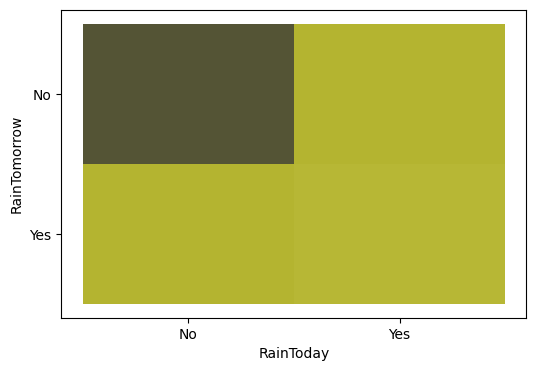

In [25]:
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='RainToday', y='RainTomorrow',color='y')
plt.show()


# Bivariate analysis

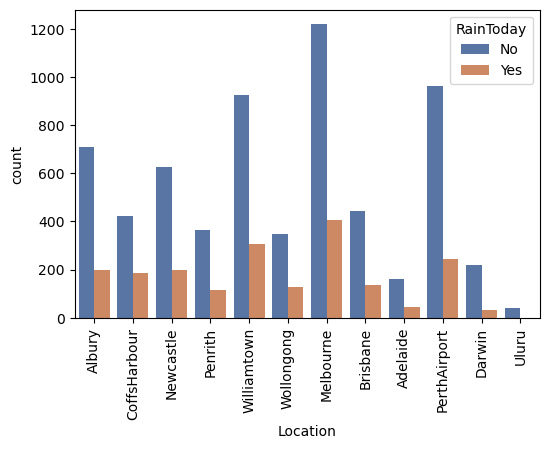

In [26]:
# Analysis with Target variable.
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='Location', hue='RainToday')
plt.xticks(fontsize=10,rotation=90)
plt.show()

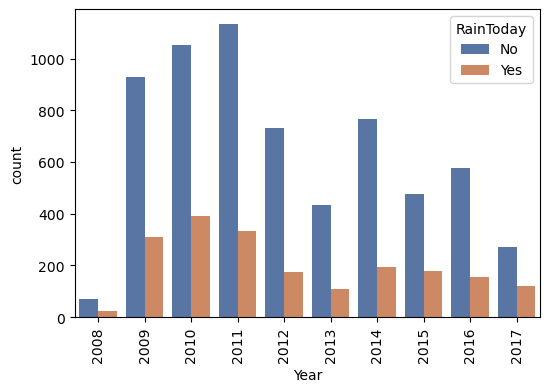

In [27]:
# Analysis with Target variable.
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='Year', hue='RainToday')
plt.xticks(fontsize=10,rotation=90)
plt.show()

Maximum RainFall in 2009,2010 & 2011 and Minimum Rainfall in 2008,2016 & 2017

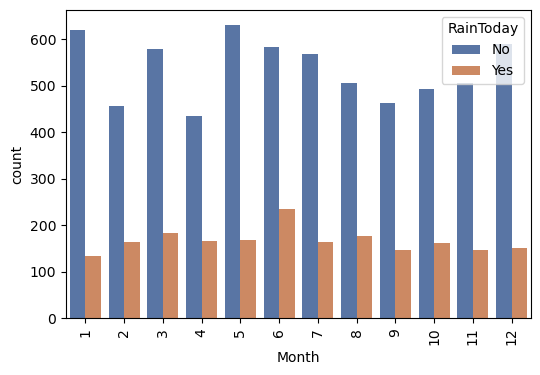

In [28]:
# Analysis with Target variable.
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='Month', hue='RainToday')
plt.xticks(fontsize=10,rotation=90)
plt.show()


Maximum RainFall in month of June and Minimum Rainfall in month of January.

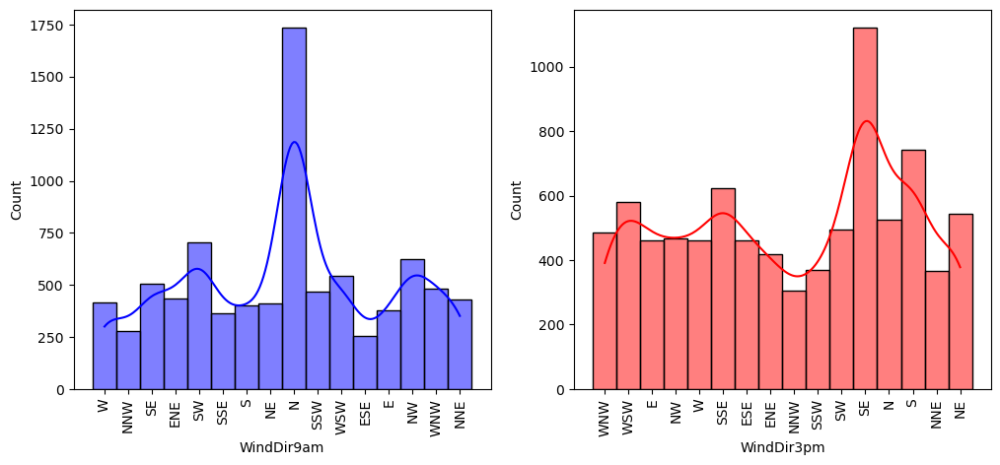

In [29]:
# Plotting histogram for Wind Direction at (9AM and 3PM)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['WindDir9am'],kde=True,color='b')
plt.xticks(fontsize=10,rotation=90)
plt.subplot(1,2,2)
sns.histplot(df['WindDir3pm'],kde=True,color='r')
plt.xticks(fontsize=10,rotation=90)

plt.show()

1.Wind direction at 9AM is in North Direction.

2.Wind direction at 3PM is in South East Direction Most of the time.

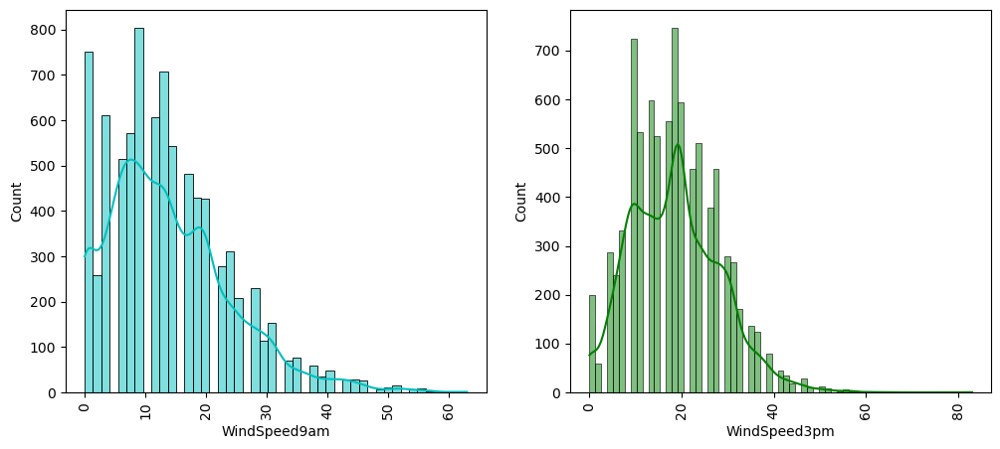

In [30]:
#-Plotting histogram for Wind Speed at (9AM and 3PM)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['WindSpeed9am'],kde=True,color='c')
plt.xticks(fontsize=10,rotation=90)

plt.subplot(1,2,2)
sns.histplot(df['WindSpeed3pm'],kde=True,color='g')
plt.xticks(fontsize=10,rotation=90)

plt.show()


1.Wind Speed at 9AM is Less than 10 Km/s.

2.Wind Speed at 4PM is 20 Km/s Most of the time.

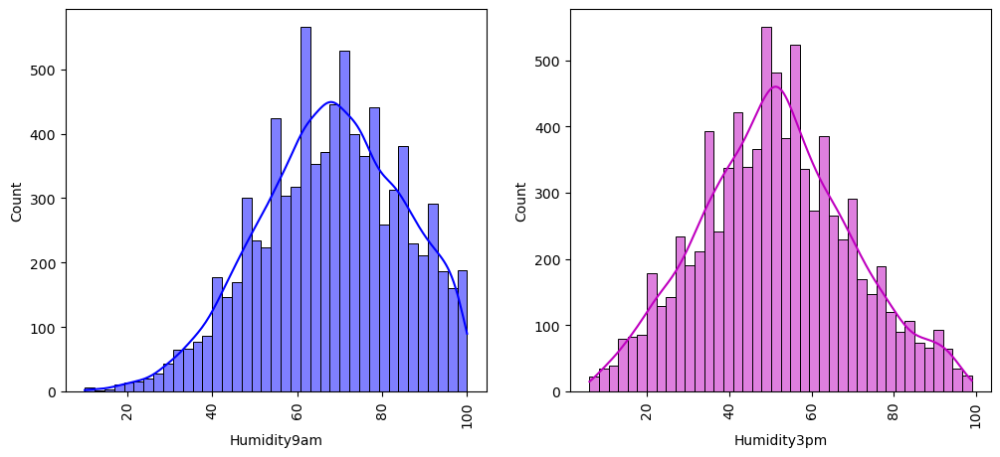

In [31]:
#-Plotting histogram for Humidity at (9AM and 3PM)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Humidity9am'],kde=True,color='b')
plt.xticks(fontsize=10,rotation=90)

plt.subplot(1,2,2)
sns.histplot(df['Humidity3pm'],kde=True,color='m')
plt.xticks(fontsize=10,rotation=90)

plt.show()

1.Humidity at 9AM is 60-88

2.Humidity at 4PM is 40-65 Most of the time.

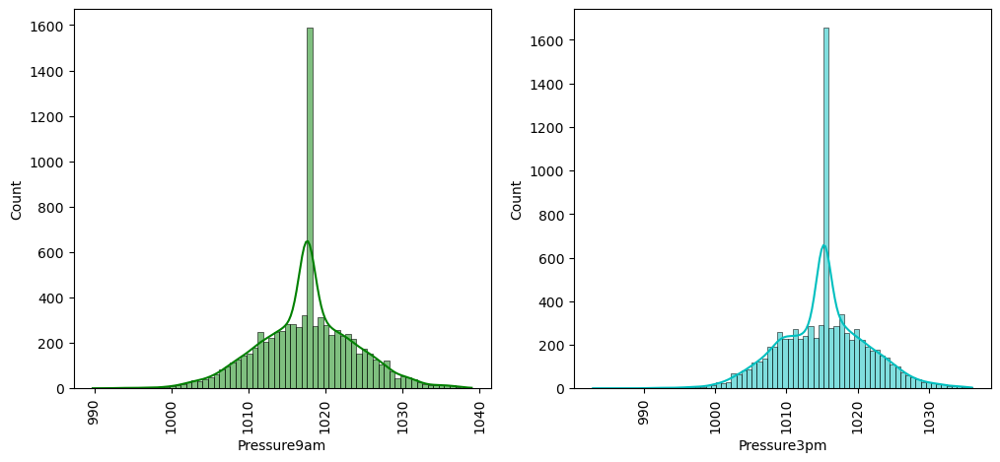

In [32]:
#-Plotting histogram for Pressure at (9AM and 3PM)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Pressure9am'],kde=True,color='g')
plt.xticks(fontsize=10,rotation=90)

plt.subplot(1,2,2)
sns.histplot(df['Pressure3pm'],kde=True,color='c')
plt.xticks(fontsize=10,rotation=90)

plt.show()

1.Pressure at 9AM is 1018

2.Pressure at 3PM is 1015 

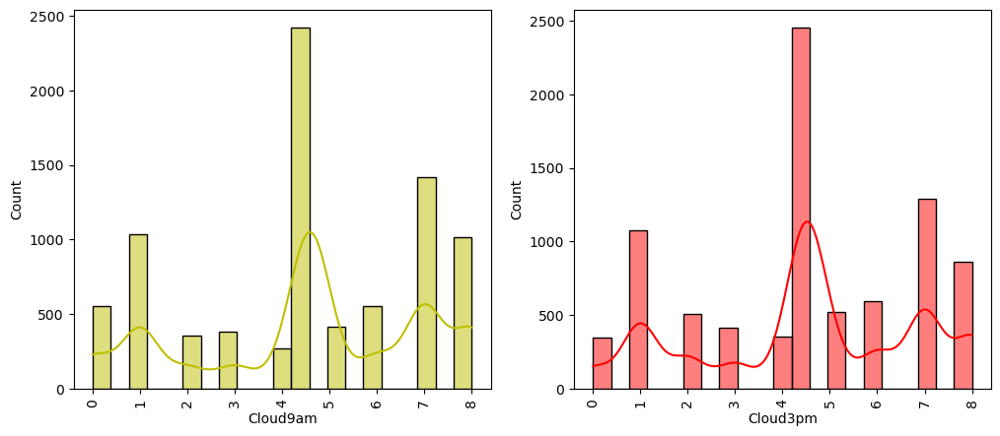

In [33]:
#-Plotting histogram for Cloud at (9AM and 3PM)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Cloud9am'],kde=True,color='y')
plt.xticks(fontsize=10,rotation=90)

plt.subplot(1,2,2)
sns.histplot(df['Cloud3pm'],kde=True,color='r')
plt.xticks(fontsize=10,rotation=90)

plt.show()

Density of Cloud at 9am And 3pm is Maximum at 4.

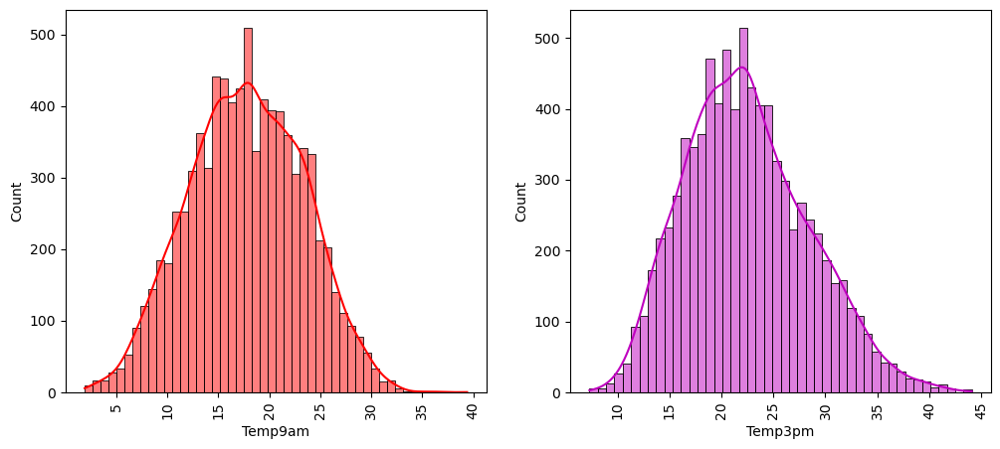

In [34]:
# Plotting histogram for Temperature  at (9AM and 3PM)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Temp9am'],kde=True,color='r')
plt.xticks(fontsize=10,rotation=90)
plt.subplot(1,2,2)
sns.histplot(df['Temp3pm'],kde=True,color='m')
plt.xticks(fontsize=10,rotation=90)

plt.show()

Average Temperature high at (9am And 3pm) is 15 to 30

# multivariate analysis

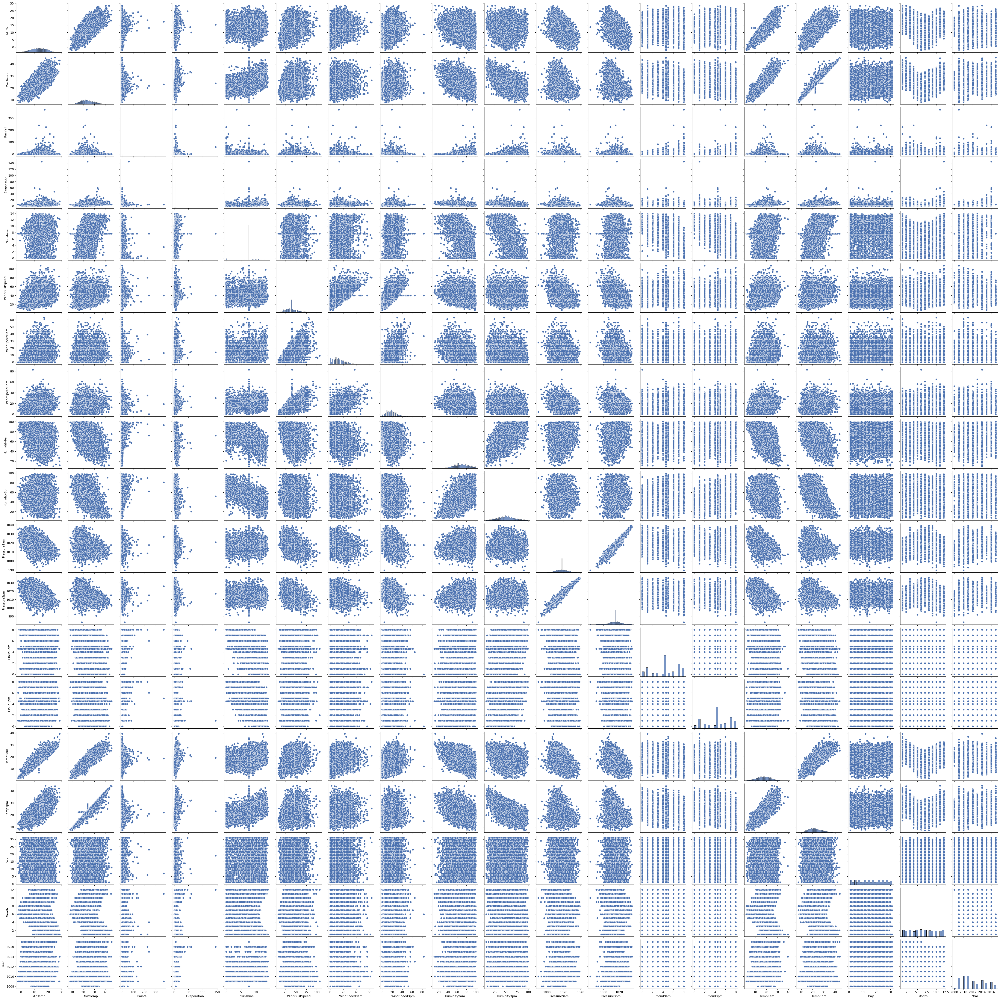

In [35]:
df.reset_index(drop=True, inplace=True)
sns.pairplot(df,palette='Dark')
plt.show()

# encoding categorical column to numerical column

In [36]:
from sklearn.preprocessing import LabelEncoder

columns_to_encode = ['Location','WindGustDir','WindDir9am','WindDir3pm']
label_encoder = LabelEncoder()

for col in columns_to_encode:
    df[col] = label_encoder.fit_transform(df[col])

In [37]:
df.dtypes

Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
Day                int32
Month              int32
Year               int32
dtype: object

# Statistical Analysis

In [80]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Location,8425.0,5.793591e+00,3.162654,0.000000,3.000000,6.000000,8.000000,11.000000
MinTemp,8425.0,1.319331e+01,5.379488,-2.000000,9.300000,13.200000,17.300000,28.500000
MaxTemp,8425.0,2.385998e+01,6.114516,8.200000,19.300000,23.300000,28.000000,45.500000
Rainfall,8425.0,4.048196e-17,1.000059,-0.748384,-0.748384,-0.748384,1.339046,1.538062
Evaporation,8425.0,5.060245e-17,1.000059,-3.362276,-0.368007,0.178888,0.178888,9.977992
Sunshine,8425.0,7.632205e+00,2.825451,0.000000,7.632205,7.632205,8.900000,13.900000
WindGustDir,8425.0,7.217804e+00,4.702616,0.000000,3.000000,7.000000,12.000000,15.000000
WindGustSpeed,8425.0,4.017447e+01,13.776101,7.000000,31.000000,40.174469,48.000000,107.000000
WindDir9am,8425.0,7.267418e+00,4.588045,0.000000,3.000000,7.000000,12.000000,15.000000
WindDir3pm,8425.0,7.810445e+00,4.430162,0.000000,4.000000,8.000000,11.000000,15.000000


# Correlation between dataset

<Axes: >

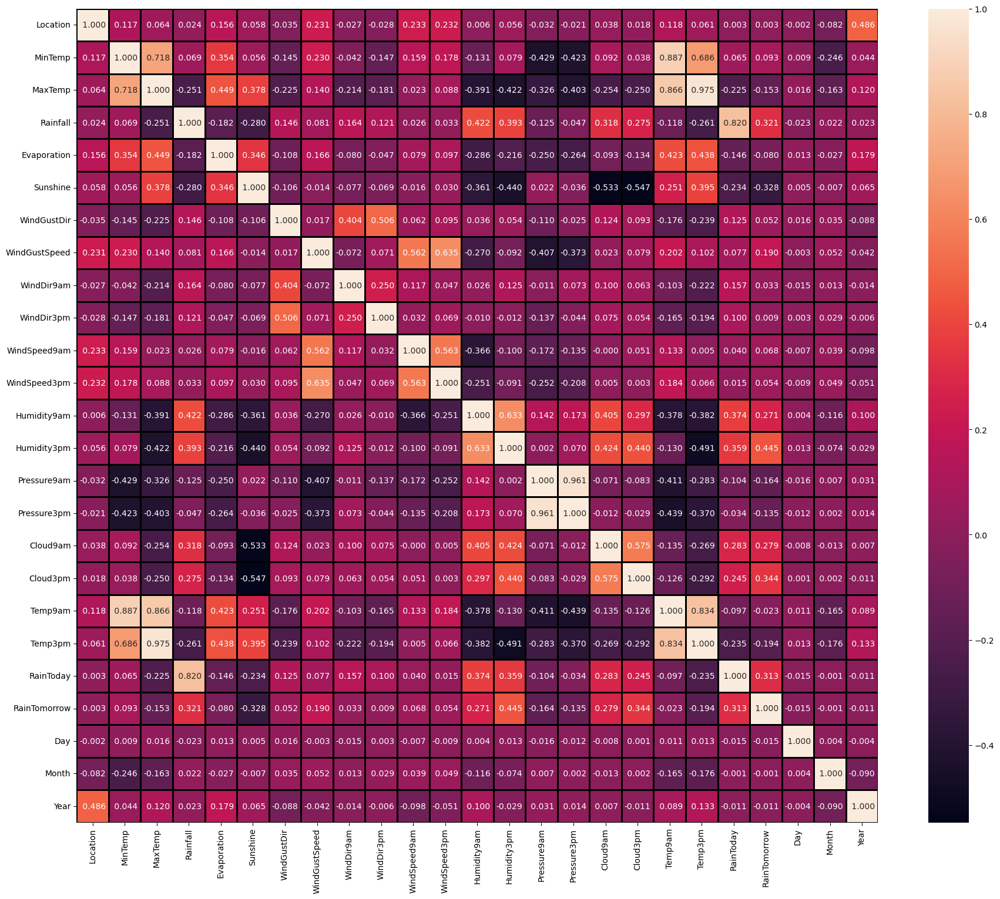

In [81]:
plt.figure(figsize=(22,18))
sns.heatmap(df.corr(),annot=True,linewidths=1,linecolor='black',fmt=' .3f' )

Windspeed & WindGustspeed is highly correlated

Temp3pm is correlated to minTemp And MaxTemp

Sunshine is Correlated to MaxTemp

Cloud is Negativly correlated to Sunshine

Humidity and pressure3pm is Negatively Correlated to Temp3pm

# Outlier Detection

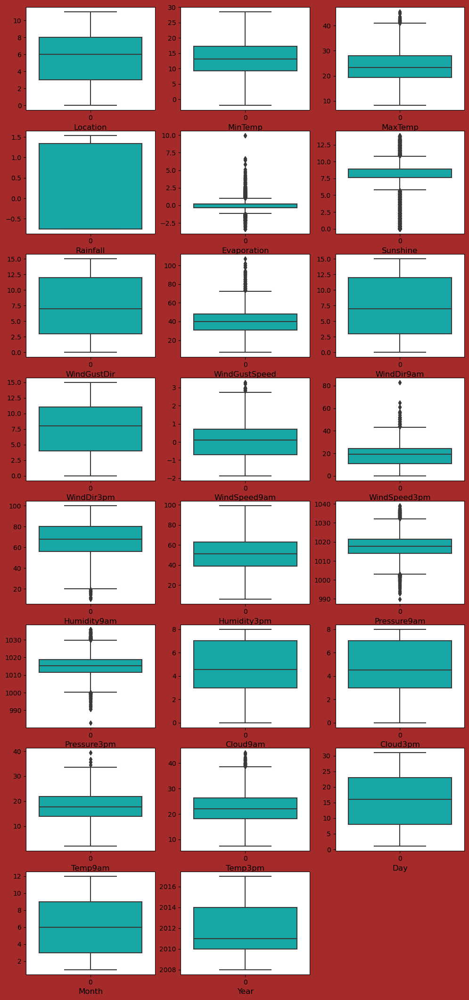

In [82]:
columns=['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'Day', 'Month', 'Year']
plt.figure(figsize=(12,30),facecolor='brown')
index=1
for column in columns:
    if index <=25:
        ax = plt.subplot(9,3,index)
        sns.boxplot(df[column], color='c')
        plt.xlabel(column,fontsize=12)
    index+=1
plt.show()

We can easily identify Outliers in above map.
These Column contain Outliers.[ 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed','WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

# Outlier Removing

In [83]:
from scipy.stats import zscore

# Specify the columns to remove outliers
columns_to_remove_outliers = [ 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed',
                              'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm',
                              'Temp9am', 'Temp3pm']

# Calculate z-scores for each specified column
z_scores = df[columns_to_remove_outliers].apply(zscore)

# Set a threshold for z-scores ( 3)
threshold = 3

# Remove rows with z-scores beyond the threshold in any specified column
df1 = df[(z_scores.abs() < threshold).all(axis=1)]

# Checking Skewness Of Dataset

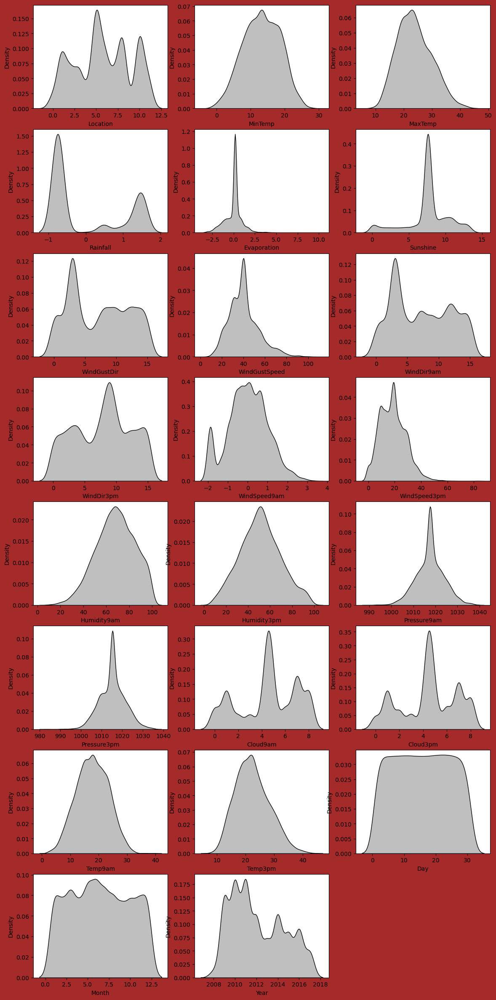

In [84]:
plt.figure(figsize=(14,30), facecolor='brown')
plotnumber=1
for column in columns:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        sns.distplot(df[column], color='k',hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

In [85]:
df.skew()

Location        -0.050456
MinTemp         -0.089989
MaxTemp          0.380654
Rainfall         0.658108
Evaporation      0.343357
Sunshine        -0.716525
WindGustDir      0.119640
WindGustSpeed    0.757000
WindDir9am       0.172792
WindDir3pm      -0.119847
WindSpeed9am     0.019806
WindSpeed3pm     0.494217
Humidity9am     -0.256743
Humidity3pm      0.118281
Pressure9am     -0.024082
Pressure3pm     -0.010214
Cloud9am        -0.366503
Cloud3pm        -0.276294
Temp9am         -0.014748
Temp3pm          0.397331
RainToday        1.242362
RainTomorrow     1.241588
Day              0.004260
Month            0.039388
Year             0.418663
dtype: float64

# Removing Skewness

In [86]:
# columns with right-skewed data containing zeros
right_skewed =  ['Rainfall','Evaporation','WindSpeed9am']

from sklearn.preprocessing import PowerTransformer
scale = PowerTransformer(method='yeo-johnson')

# Transfroming skew data
df[right_skewed] = scale.fit_transform(df[right_skewed].values)

In [87]:
df.skew()

Location        -0.050456
MinTemp         -0.089989
MaxTemp          0.380654
Rainfall         0.564230
Evaporation      0.306479
Sunshine        -0.716525
WindGustDir      0.119640
WindGustSpeed    0.757000
WindDir9am       0.172792
WindDir3pm      -0.119847
WindSpeed9am     0.021043
WindSpeed3pm     0.494217
Humidity9am     -0.256743
Humidity3pm      0.118281
Pressure9am     -0.024082
Pressure3pm     -0.010214
Cloud9am        -0.366503
Cloud3pm        -0.276294
Temp9am         -0.014748
Temp3pm          0.397331
RainToday        1.242362
RainTomorrow     1.241588
Day              0.004260
Month            0.039388
Year             0.418663
dtype: float64

# Splitting Dataset

In [39]:
feature=['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'Day', 'Month', 'Year']
target1=['RainToday']
target2=['RainTomorrow']

In [40]:
X=df[feature]
Y=df[target1]
y=df[target2]

# Feature Scaling

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# variance_inflation_factor

In [42]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
vif['Features'] = X.columns
vif

,VIF,Features
0,1.559444,Location
1,8.462719,MinTemp
2,26.346656,MaxTemp
3,1.134838,Rainfall
4,1.208988,Evaporation
5,1.825974,Sunshine
6,1.596468,WindGustDir
7,2.408787,WindGustSpeed
8,1.343975,WindDir9am
9,1.485966,WindDir3pm


# Machine learning Model [RainToday]

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score
from sklearn.metrics import  r2_score
from sklearn import preprocessing
from sklearn import utils

In [44]:
# Spliting the data for training & testing.
for i in range(1,250):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=i, test_size=.2)
    
X_train.shape

(6740, 23)

# LogisticRegression

In [45]:
from sklearn.linear_model import LogisticRegression
maxAccu=0
maxRS=0

for i in range(1,250):
    X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size = 0.2, random_state=i)
    lr=LogisticRegression()
    lr.fit(X_train,Y_train)
    Y_pred=lr.predict(X_test)
    acc=accuracy_score(Y_test,Y_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is', maxAccu*100 ,'on Random_state', maxRS)

Best accuracy is 95.37091988130564 on Random_state 113


In [46]:
print('\033[1m'+'Accuracy Score of Logistics Regression :'+'\033[0m', accuracy_score(Y_test, Y_pred))
print('\n')
print('\033[1m'+'Confusion matrix of Logistics Regression :'+'\033[0m \n',confusion_matrix(Y_test, Y_pred))
print('\n')
print('\033[1m'+'classification Report of Logistics Regression'+'\033[0m \n',classification_report(Y_test, Y_pred))

Accuracy Score of Logistics Regression : 0.9370919881305638


Confusion matrix of Logistics Regression : 
 [[1240   36]
 [  70  339]]


classification Report of Logistics Regression 
               precision    recall  f1-score   support

          No       0.95      0.97      0.96      1276
         Yes       0.90      0.83      0.86       409

    accuracy                           0.94      1685
   macro avg       0.93      0.90      0.91      1685
weighted avg       0.94      0.94      0.94      1685



# Model Classification

In [47]:
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier

In [48]:
models = [SVC(), GaussianNB(), DecisionTreeClassifier(), 
          KNeighborsClassifier(n_neighbors=3), RandomForestClassifier(), ExtraTreesClassifier()]

for model in models:
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    print('\033[1m' + 'Classification ML Algorithm Evaluation Matrix for', model.__class__.__name__ + ':' + '\033[0m')
    print('\n')
    print('\033[1m' + 'Accuracy Score :' + '\033[0m\n', accuracy_score(Y_test, Y_pred))
    print('\n')
    print('\033[1m' + 'Confusion matrix :' + '\033[0m \n', confusion_matrix(Y_test, Y_pred))
    print('\n')
    print('\033[1m' + 'Classification Report :' + '\033[0m \n', classification_report(Y_test, Y_pred))
    print('\n')
    
    print('='*100)

Classification ML Algorithm Evaluation Matrix for SVC:


Accuracy Score :
 0.9323442136498516


Confusion matrix : 
 [[1264   12]
 [ 102  307]]


Classification Report : 
               precision    recall  f1-score   support

          No       0.93      0.99      0.96      1276
         Yes       0.96      0.75      0.84       409

    accuracy                           0.93      1685
   macro avg       0.94      0.87      0.90      1685
weighted avg       0.93      0.93      0.93      1685



Classification ML Algorithm Evaluation Matrix for GaussianNB:


Accuracy Score :
 0.9228486646884273


Confusion matrix : 
 [[1184   92]
 [  38  371]]


Classification Report : 
               precision    recall  f1-score   support

          No       0.97      0.93      0.95      1276
         Yes       0.80      0.91      0.85       409

    accuracy                           0.92      1685
   macro avg       0.89      0.92      0.90      1685
weighted avg       0.93      0.92      0.92     

# Hyperparameter Tuning

In [49]:
from sklearn.model_selection import GridSearchCV

In [50]:
parameter={'n_estimators':[200,400],'max_depth':[2,3],'min_samples_leaf':[1,2],'min_samples_split':[2,2.5],
         'criterion':['gini']}

In [51]:
grid_search = GridSearchCV(RandomForestClassifier(),parameter, cv=5, scoring='accuracy',verbose=5)
grid_search.fit(X_train, Y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV 1/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.891 total time=   1.3s
[CV 2/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.911 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.897 total time=   1.3s
[CV 4/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.880 total time=   1.3s
[CV 5/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.900 total time=   1.3s
[CV 1/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.901 total time=   2.7s
[CV 2/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.890 total time=   2.6s
[CV 3/5]

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini'], 'max_depth': [2, 3],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 2.5],
                         'n_estimators': [200, 400]},
             scoring='accuracy', verbose=5)

In [52]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 400}


# Final Model for [RainToday]

In [53]:
model=RandomForestClassifier(criterion = 'gini', max_depth = 3, min_samples_leaf = 2, min_samples_split = 2, n_estimators = 200)

In [54]:
model.fit(X_train,Y_train)
pred = model.predict(X_test)
print('\033[1m'+'RandomForestClassifier Evaluation'+'\033[0m')
print('\n')
print('\033[1m'+'Accuracy Score of RandomForestClassifier :'+'\033[0m', accuracy_score(Y_test, pred))
print('\n')
print('\033[1m'+'Confusion matrix ofRandomForestClassifier :'+'\033[0m \n',confusion_matrix(Y_test, pred))
print('\n')
print('\033[1m'+'classification Report of RandomForestClassifier '+'\033[0m \n',classification_report(Y_test, pred))

RandomForestClassifier Evaluation


Accuracy Score of RandomForestClassifier : 0.9519287833827893


Confusion matrix ofRandomForestClassifier : 
 [[1260   16]
 [  65  344]]


classification Report of RandomForestClassifier  
               precision    recall  f1-score   support

          No       0.95      0.99      0.97      1276
         Yes       0.96      0.84      0.89       409

    accuracy                           0.95      1685
   macro avg       0.95      0.91      0.93      1685
weighted avg       0.95      0.95      0.95      1685



In [55]:
Y_test

,RainToday
5591,No
5506,Yes
1071,No
5795,Yes
7983,No
...,...
3281,Yes
4059,No
1403,No
8080,No


# Machine learning Model [RainTomorrow]

In [57]:
# Spliting the data for training & testing.
for i in range(1,250):
    X_train, X_test, y_train, y_test = train_test_split(X,y , random_state=i, test_size=.2)
    
X_train.shape

(6740, 23)

# LogisticRegression

In [58]:
from sklearn.linear_model import LogisticRegression
maxAccu=0
maxRS=0
for i in range(1,250):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2, random_state=i)
    lr=LogisticRegression()
    lr.fit(X_train,y_train)
    y_pred=lr.predict(X_test)
    acc=accuracy_score(y_test,y_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is', maxAccu*100 ,'on Random_state', maxRS)

Best accuracy is 85.4005934718101 on Random_state 81


In [59]:
print('\033[1m'+'Accuracy Score of Logistics Regression :'+'\033[0m', accuracy_score(y_test, y_pred))
print('\n')
print('\033[1m'+'Confusion matrix of Logistics Regression :'+'\033[0m \n',confusion_matrix(y_test, y_pred))
print('\n')
print('\033[1m'+'classification Report of Logistics Regression'+'\033[0m \n',classification_report(y_test, y_pred))

Accuracy Score of Logistics Regression : 0.8415430267062315


Confusion matrix of Logistics Regression : 
 [[1225   72]
 [ 195  193]]


classification Report of Logistics Regression 
               precision    recall  f1-score   support

          No       0.86      0.94      0.90      1297
         Yes       0.73      0.50      0.59       388

    accuracy                           0.84      1685
   macro avg       0.80      0.72      0.75      1685
weighted avg       0.83      0.84      0.83      1685



# Model Classification

In [60]:
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier

In [61]:
models = [SVC(), GaussianNB(), DecisionTreeClassifier(), 
          KNeighborsClassifier(n_neighbors=3), RandomForestClassifier(), ExtraTreesClassifier()]

for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print('\033[1m' + 'Classification ML Algorithm Evaluation Matrix for', model.__class__.__name__ + ':' + '\033[0m')
    print('\n')
    print('\033[1m' + 'Accuracy Score :' + '\033[0m\n', accuracy_score(y_test, y_pred))
    print('\n')
    print('\033[1m' + 'Confusion matrix :' + '\033[0m \n', confusion_matrix(y_test, y_pred))
    print('\n')
    print('\033[1m' + 'Classification Report :' + '\033[0m \n', classification_report(y_test, y_pred))
    print('\n')
    print('='*100)

Classification ML Algorithm Evaluation Matrix for SVC:


Accuracy Score :
 0.8599406528189911


Confusion matrix : 
 [[1242   55]
 [ 181  207]]


Classification Report : 
               precision    recall  f1-score   support

          No       0.87      0.96      0.91      1297
         Yes       0.79      0.53      0.64       388

    accuracy                           0.86      1685
   macro avg       0.83      0.75      0.78      1685
weighted avg       0.85      0.86      0.85      1685



Classification ML Algorithm Evaluation Matrix for GaussianNB:


Accuracy Score :
 0.8148367952522255


Confusion matrix : 
 [[1129  168]
 [ 144  244]]


Classification Report : 
               precision    recall  f1-score   support

          No       0.89      0.87      0.88      1297
         Yes       0.59      0.63      0.61       388

    accuracy                           0.81      1685
   macro avg       0.74      0.75      0.74      1685
weighted avg       0.82      0.81      0.82     

# Hyperparameter Tuning


In [62]:
from sklearn.model_selection import GridSearchCV

In [63]:
parameter={'n_estimators':[200,400],'max_depth':[2,3],'min_samples_leaf':[1,2],'min_samples_split':[2,2.5],
         'criterion':['gini']}

In [64]:
grid_search = GridSearchCV(RandomForestClassifier(),parameter, cv=5, scoring='accuracy',verbose=5)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV 1/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.798 total time=   1.4s
[CV 2/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.801 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.792 total time=   1.4s
[CV 4/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.792 total time=   1.4s
[CV 5/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.788 total time=   1.4s
[CV 1/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.790 total time=   2.8s
[CV 2/5] END criterion=gini, max_depth=2, min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.803 total time=   2.7s
[CV 3/5]

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini'], 'max_depth': [2, 3],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 2.5],
                         'n_estimators': [200, 400]},
             scoring='accuracy', verbose=5)

In [65]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 400}


# Final Model for [RainTomorrow]

In [66]:
model=RandomForestClassifier(criterion = 'gini', max_depth = 3, min_samples_leaf = 1, min_samples_split = 2, n_estimators = 200)

In [67]:
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
print('\033[1m'+'RandomForestClassifier Evaluation'+'\033[0m')
print('\n')
print('\033[1m'+'Accuracy Score of RandomForestClassifier :'+'\033[0m', accuracy_score(y_test, y_pred))
print('\n')
print('\033[1m'+'Confusion matrix ofRandomForestClassifier :'+'\033[0m \n',confusion_matrix(y_test, y_pred))
print('\n')
print('\033[1m'+'classification Report of RandomForestClassifier '+'\033[0m \n',classification_report(y_test, y_pred))

RandomForestClassifier Evaluation


Accuracy Score of RandomForestClassifier : 0.8160237388724035


Confusion matrix ofRandomForestClassifier : 
 [[1280   17]
 [ 293   95]]


classification Report of RandomForestClassifier  
               precision    recall  f1-score   support

          No       0.81      0.99      0.89      1297
         Yes       0.85      0.24      0.38       388

    accuracy                           0.82      1685
   macro avg       0.83      0.62      0.64      1685
weighted avg       0.82      0.82      0.77      1685



In [68]:
y_pred = np.squeeze(y_pred)
y_test = np.squeeze(y_test)

# Create the DataFrame
prediction = pd.DataFrame({'predicted values': y_pred, 'actual values': y_test})
prediction

,predicted values,actual values
5591,No,No
5506,No,No
1071,No,No
5795,Yes,Yes
7983,No,No
...,...,...
3281,No,No
4059,No,Yes
1403,No,Yes
8080,No,No


# Best Model Saving

In [69]:
import joblib
joblib.dump(model,'Rainfall_Weather_Forecasting.pkl')

['Rainfall_Weather_Forecasting.pkl']